In [1]:
from src.config import config
import pandas as pd
import os
img_dir = os.path.join(config["DATA_DIR"], "3D_val_npz")
gts_dir = os.path.join(config["DATA_DIR"], "3D_val_gt_interactive_seg")
output_dir = os.path.join(config["RESULTS_DIR"], "simple")

Loaded configuration for machine: nora


In [2]:
merged_df = pd.read_csv("post_challenge/stats_by_case.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'post_challenge/stats_by_case.csv'

In [45]:
# list of unique case names (truncated to 10 characters)
merged_df["CaseName_trunc"] = merged_df["CaseName"].apply(lambda x: x[:11])
CaseName_trunc = merged_df["CaseName_trunc"].unique().tolist()
len(CaseName_trunc)

45

In [46]:
# stats per CaseName_trunc value
merged_df.groupby("CaseName_trunc")[["nninteractive_DSC_AUC","nninteractive_DSC_Final"]].mean().sort_values(ascending=False, by="nninteractive_DSC_Final")

,nninteractive_DSC_AUC,nninteractive_DSC_Final
CaseName_trunc,,
CT_LungMask,3.866286,0.968853
CT_totalseg,3.809729,0.955020
MR_CHAOS-T2,3.767192,0.942988
MR_Heart_la,3.687932,0.930639
MR_CHAOS-T1,3.668111,0.926828
MR_Prostate,3.645300,0.916713
CT_AbdomenA,3.632200,0.916163
CT_TCIA-LCT,3.622184,0.915156
CT_TotalSeg,3.521998,0.899300


In [47]:
# for each CaseName_trunc, provide the case with lower nninteractive_DSC_Final, 
# as well as the mean nninteractive_DSC_Final for that case
case_names = []
for case in CaseName_trunc:
    sub_df = merged_df[merged_df["CaseName_trunc"]==case]
    min_row = sub_df.loc[sub_df["nninteractive_DSC_Final"].idxmin()]
    mean_dsc = sub_df["nninteractive_DSC_Final"].mean()
    case_names.append((min_row["CaseName"], min_row["nninteractive_DSC_Final"], mean_dsc))

In [48]:
# sort case_names by mean_dsc
case_names = sorted(case_names, key=lambda x: x[2])

Unique values in the ground truth: [0 1]
Unique values in the prediction: [0 1]


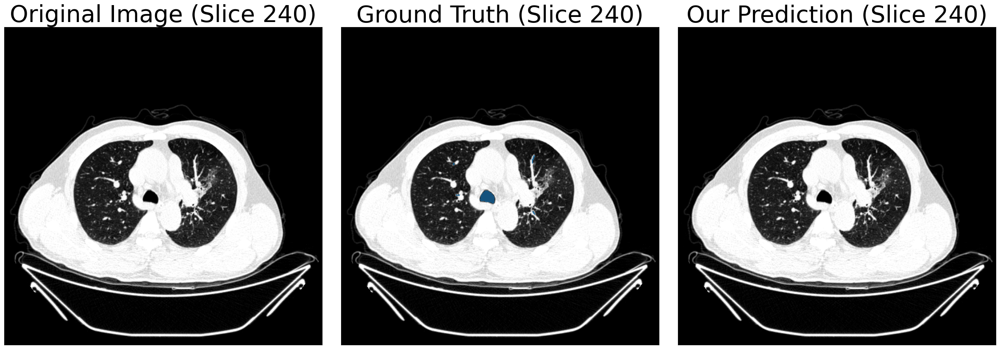

In [49]:
import os
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap

def visualize_case(case_filename):
    """
    Visualize original image with ground truth and prediction as overlays for a given case.

    Args:
        case_filename (str): Name of the case file (without extension).
        img_dir (str): Directory where original image files are stored.
        gts_dir (str): Directory where ground truth files are stored.
        output_dir (str): Directory where prediction files are stored.
    """
    # Load image
    img_filepath = os.path.join(img_dir, case_filename + ".npz")
    if not os.path.exists(img_filepath):
        print(f"Error: Image file not found at {img_filepath}")
        return
    img_data = np.load(img_filepath)
    imgs = img_data["imgs"]

    # Load ground truth
    gt_filepath = os.path.join(gts_dir, case_filename + ".npz")
    if not os.path.exists(gt_filepath):
        print(f"Error: Ground truth file not found at {gt_filepath}")
        return
    gt_data = np.load(gt_filepath)
    gts = gt_data["gts"]
    gt_unique = np.unique(gts)
    print(f"Unique values in the ground truth: {gt_unique}")

    # Load prediction
    pred_filepath = os.path.join(output_dir, case_filename + ".npz")
    if not os.path.exists(pred_filepath):
        print(f"Error: Prediction file not found at {pred_filepath}")
        return
    pred = np.load(pred_filepath)["segs"]
    pred_unique = np.unique(pred)
    print(f"Unique values in the prediction: {pred_unique}")

    # Display all three images in a row with segmentations as overlays
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))

    # Middle slice for all images
    middle_slice = imgs.shape[0] // 2

    # Original Image
    ax1.imshow(imgs[middle_slice], cmap='gray')
    ax1.set_title(f'Original Image (Slice {middle_slice})', fontsize=40)
    ax1.set_xticks([])
    ax1.set_yticks([])

    # Original Image with Ground Truth Overlay
    ax2.imshow(imgs[middle_slice], cmap='gray')
    # Create masked array where class 0 is masked (transparent)
    gts_masked = np.ma.masked_where(gts[middle_slice] == 0, gts[middle_slice])
    ax2.imshow(gts_masked, cmap='tab20', alpha=0.7, interpolation='none')
    ax2.set_title(f'Ground Truth (Slice {middle_slice})', fontsize=40)
    ax2.set_xticks([])
    ax2.set_yticks([])

    # Original Image with Prediction Overlay
    ax3.imshow(imgs[middle_slice], cmap='gray')
    # Create masked array where class 0 is masked (transparent)
    pred_masked = np.ma.masked_where(pred[middle_slice] == 0, pred[middle_slice])
    ax3.imshow(pred_masked, cmap='tab20', alpha=0.7, interpolation='none')
    ax3.set_title(f'Our Prediction (Slice {middle_slice})', fontsize=40)
    ax3.set_xticks([])
    ax3.set_yticks([])

    plt.tight_layout()
    plt.savefig(f"{case_filename}_visualization.png", dpi=150, bbox_inches='tight')
    plt.show()
# Usage
visualize_case("CT_AirwayTree_ATM_005")

Unique values in the ground truth: [0 1]


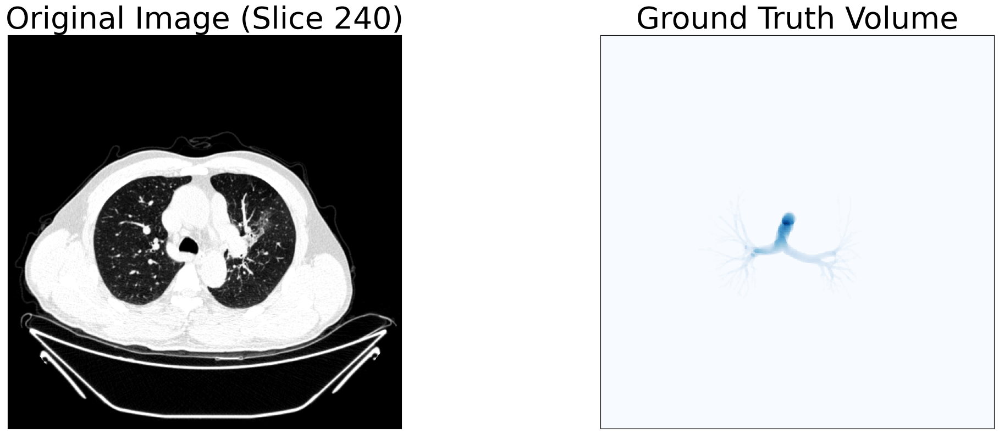

In [53]:
import os
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap

def visualize_case_3D(case_filename):
    """
    Visualize original image with ground truth and prediction as overlays for a given case.

    Args:
        case_filename (str): Name of the case file (without extension).
        img_dir (str): Directory where original image files are stored.
        gts_dir (str): Directory where ground truth files are stored.
        output_dir (str): Directory where prediction files are stored.
    """
    # Load image
    img_filepath = os.path.join(img_dir, case_filename + ".npz")
    if not os.path.exists(img_filepath):
        print(f"Error: Image file not found at {img_filepath}")
        return
    img_data = np.load(img_filepath)
    imgs = img_data["imgs"]

    # Load ground truth
    gt_filepath = os.path.join(gts_dir, case_filename + ".npz")
    if not os.path.exists(gt_filepath):
        print(f"Error: Ground truth file not found at {gt_filepath}")
        return
    gt_data = np.load(gt_filepath)
    gts = gt_data["gts"]
    gt_unique = np.unique(gts)
    print(f"Unique values in the ground truth: {gt_unique}")


    # Display all three images in a row with segmentations as overlays
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

    # Middle slice for all images
    middle_slice = imgs.shape[0] // 2

    # Original Image
    ax1.imshow(imgs[middle_slice], cmap='gray')
    ax1.set_title(f'Original Image (Slice {middle_slice})', fontsize=40)
    ax1.set_xticks([])
    ax1.set_yticks([])

    # Original Image with Ground Truth Overlay
    # ax2.imshow(imgs[middle_slice], cmap='gray')
    # Create masked array where class 0 is masked (transparent)
    # gts_masked = np.ma.masked_where(gts[middle_slice] == 0, gts[middle_slice])
    # keep only label 1
    gts_masked = np.where(gts == 1, 2, 0)
    gts_mean = np.mean(gts_masked, axis=0)
    # scale to [0,1]
    gts_mean = (gts_mean - np.min(gts_mean)) / (np.max(gts_mean) - np.min(gts_mean) + 1e-8) 


    #print(f"Unique values in the mean ground truth: {np.unique(gts_mean, return_counts=True)}")
    ax2.imshow(gts_mean, 
               cmap='Blues',
               interpolation='none')
    ax2.set_title(f'Ground Truth Volume', fontsize=40)
    ax2.set_xticks([])
    ax2.set_yticks([])



    plt.tight_layout()
    plt.savefig(f"{case_filename}_visualization.png", dpi=150, bbox_inches='tight')
    plt.show()

visualize_case_3D("CT_AirwayTree_ATM_005")

Visualizing case: CT_Aorta_AortaR9 mean DSC: 0.5378789921166155
Unique values in the ground truth: [0 1]


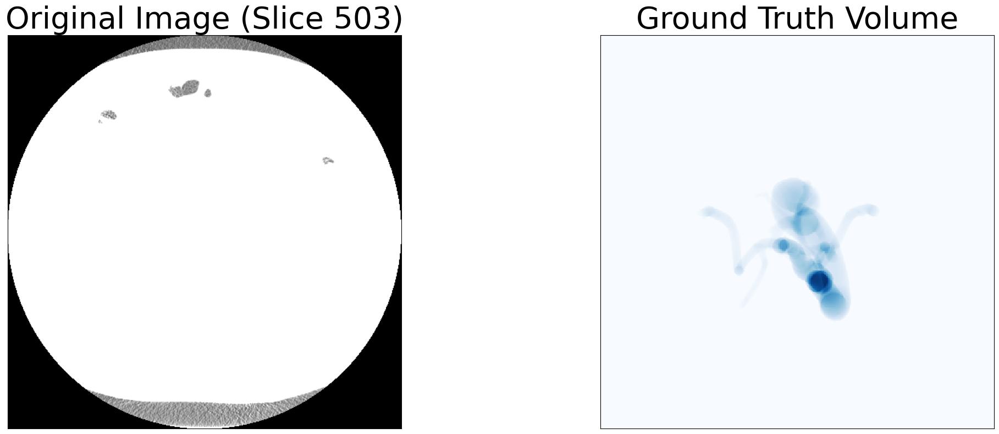

Visualizing case: MR_WMH_T1_Utrecht_17 mean DSC: 0.6593163438157877
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


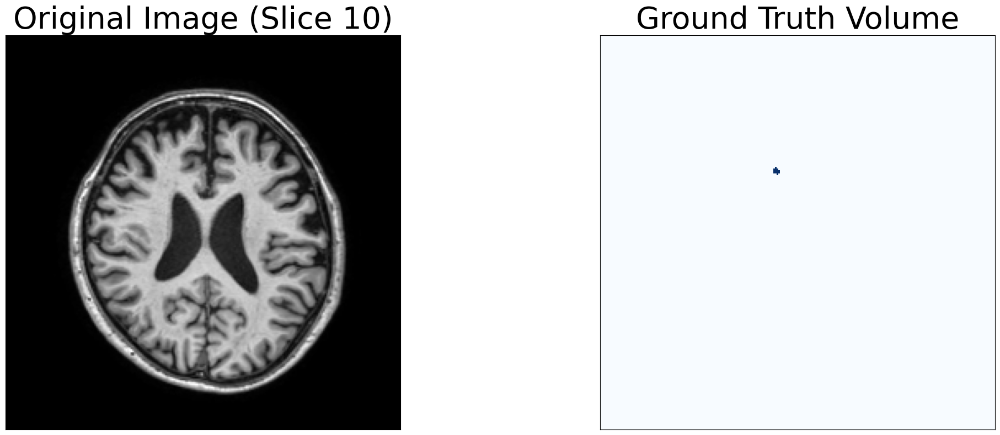

Visualizing case: MR_WMH_T1_Singapore_55 mean DSC: 0.6613610326182269
Unique values in the ground truth: [0 1 2 3 4 5 6 7 8]


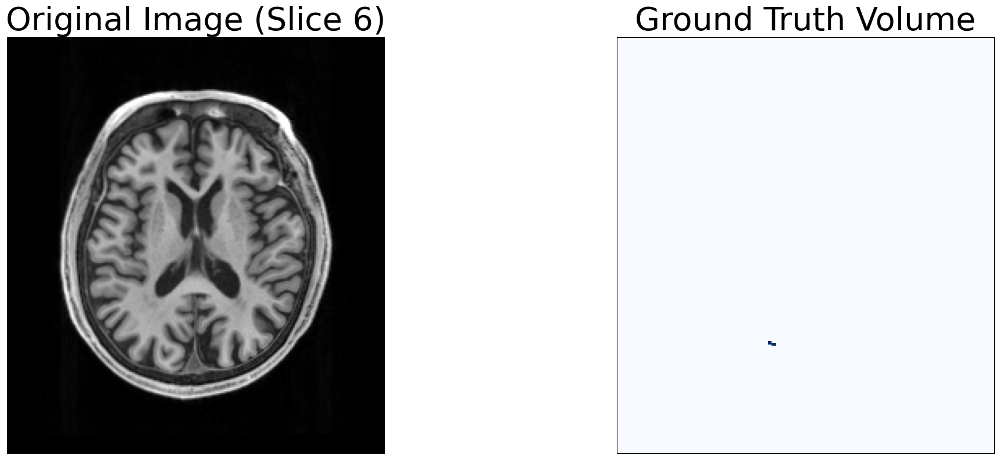

Visualizing case: MR_BraTS-T2f_bratsgli_1124 mean DSC: 0.6629828866297082
Unique values in the ground truth: [0 1 2 3]


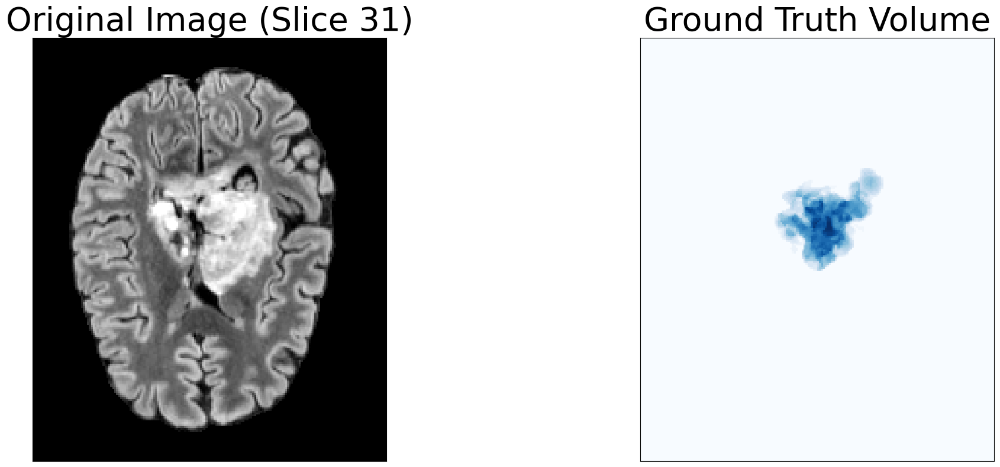

Visualizing case: MR_WMH_T1_Amsterdam_GE3T_148 mean DSC: 0.6722069335057131
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10]


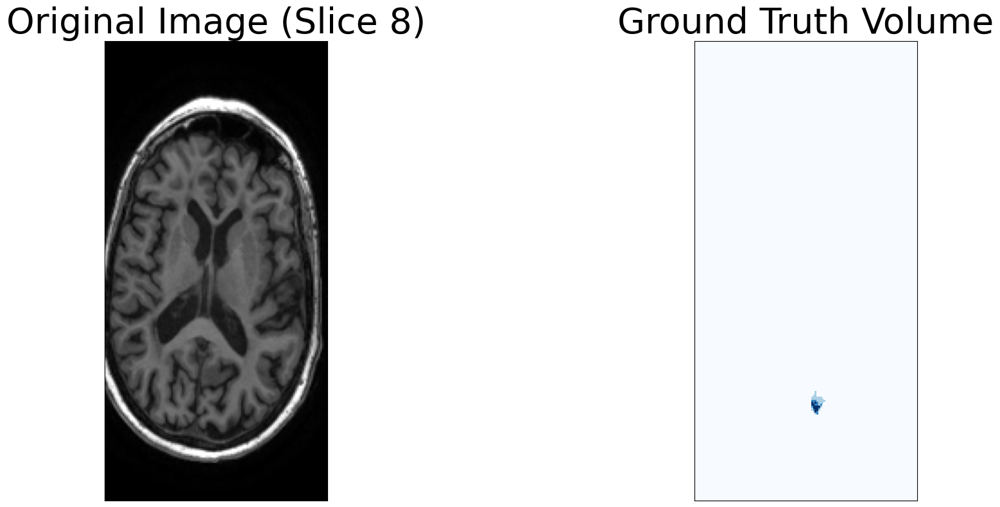

Visualizing case: MR_BraTS-T1n_bratsgli_1133 mean DSC: 0.6805555627928379
Unique values in the ground truth: [0 1 2 3 4]


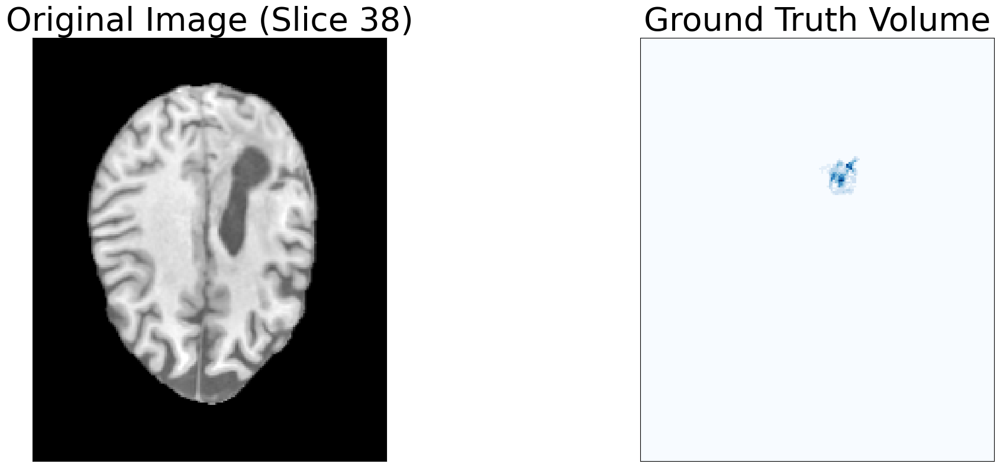

Visualizing case: CT_COVID-19-20-CT-SegChallenge_volume-covid19-A-0685 mean DSC: 0.714447817735207
Unique values in the ground truth: [0 1]


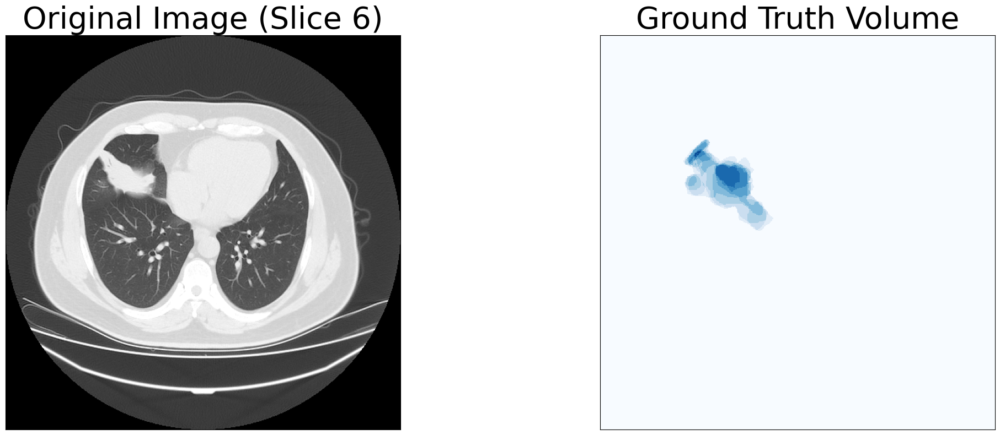

Visualizing case: MR_Spider_94_t1_spi mean DSC: 0.7247780268903202
Unique values in the ground truth: [0 1]


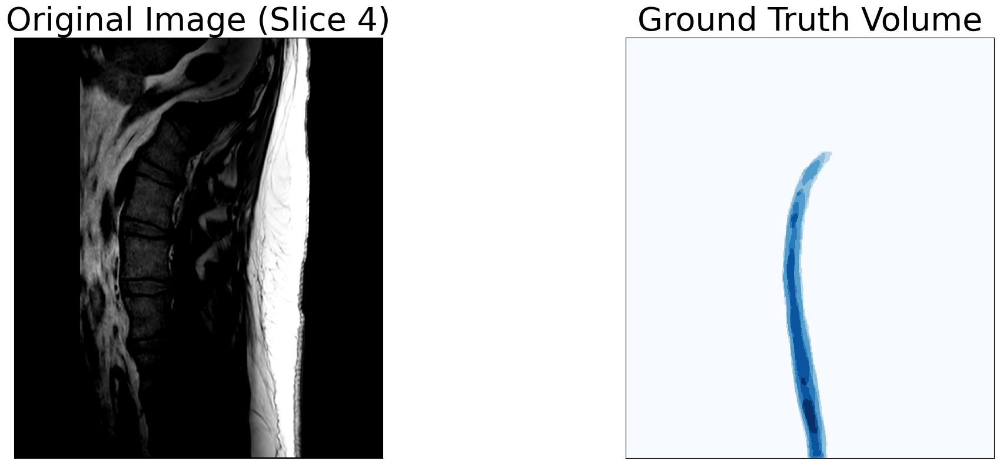

Visualizing case: MR_crossmoda_crossmoda2023_ldn_23_ceT1 mean DSC: 0.7363515058691349
Unique values in the ground truth: [0 1 2 3 4]


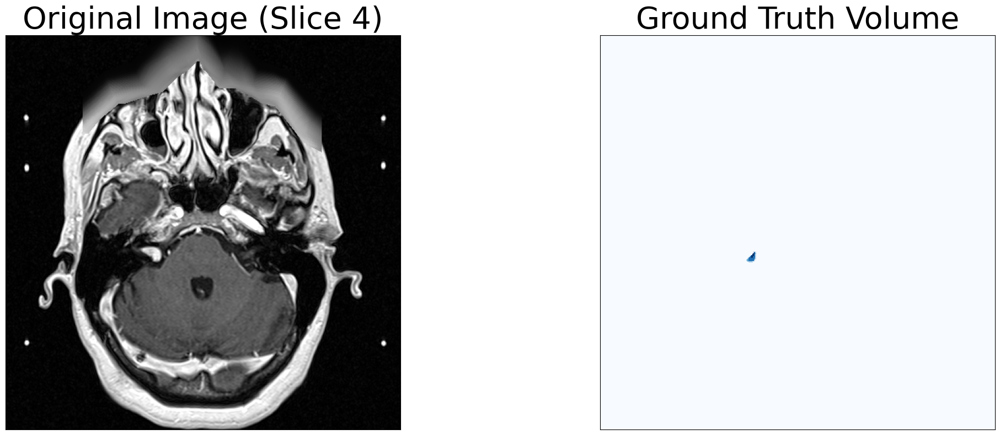

Visualizing case: MR_ISLES2022_ADC_sub-strokecase0080 mean DSC: 0.7409623546383584
Unique values in the ground truth: [0 1]


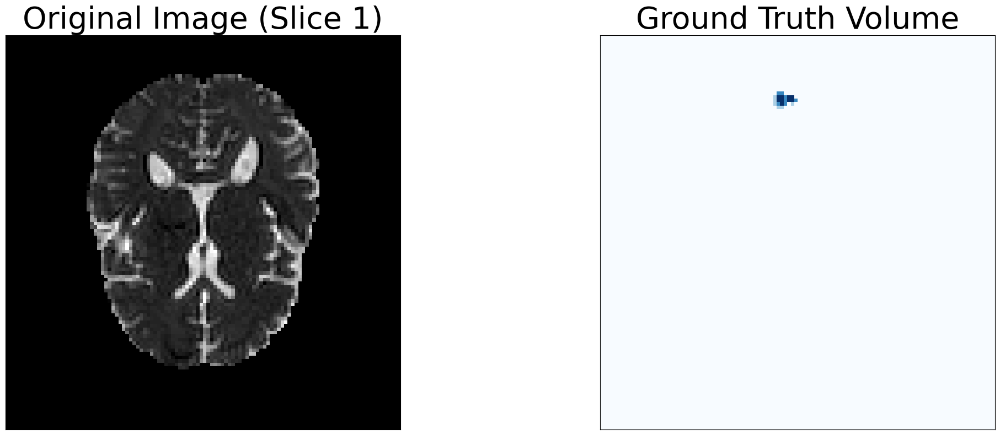

Visualizing case: CT_GTVpNCCT_segrap_0100 mean DSC: 0.7580845859087952
Unique values in the ground truth: [0 1]


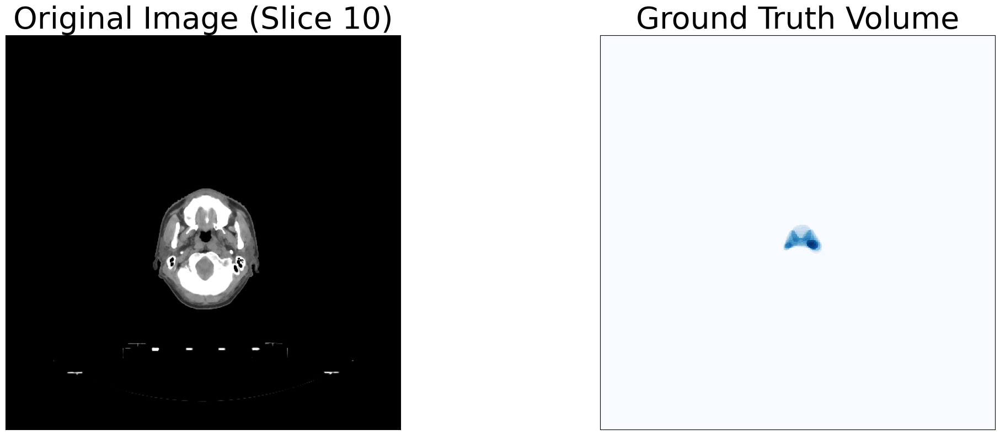

Visualizing case: MR_Spider_86_t2_ivd mean DSC: 0.7596088810552348
Unique values in the ground truth: [0 1 2 3 4 5 6]


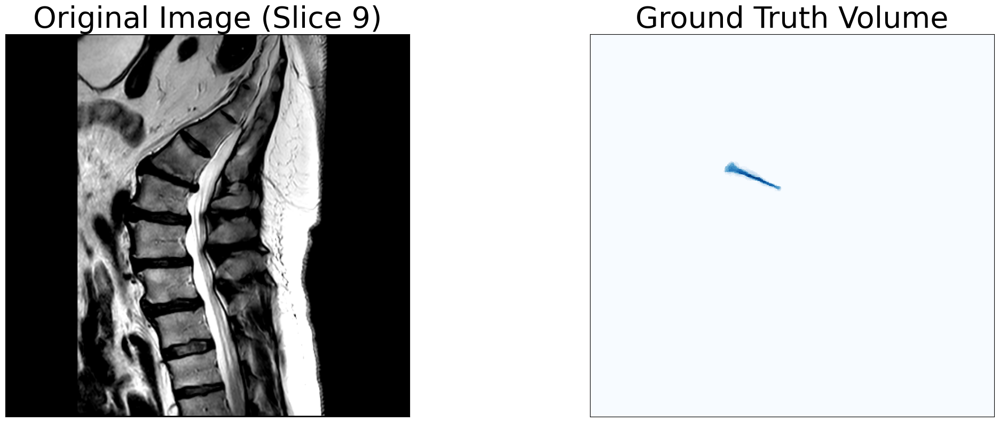

Visualizing case: MR_QIN-PROSTATE-Lesion_PCAMPMRI-00012_1_0_MR mean DSC: 0.7621773469673804
Unique values in the ground truth: [0 1]


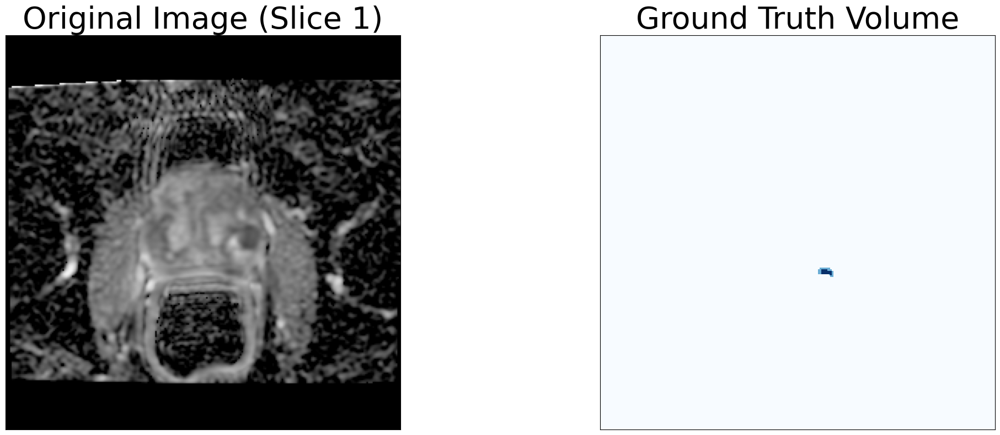

Visualizing case: MR_Spider_78_t2_spi mean DSC: 0.7642631692761486
Unique values in the ground truth: [0 1]


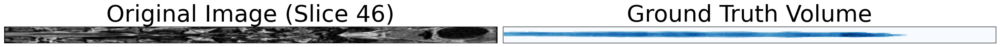

Visualizing case: MR_totalseg_mr_s0088 mean DSC: 0.7651938143286406
Unique values in the ground truth: [0 1 2 3 4 5]


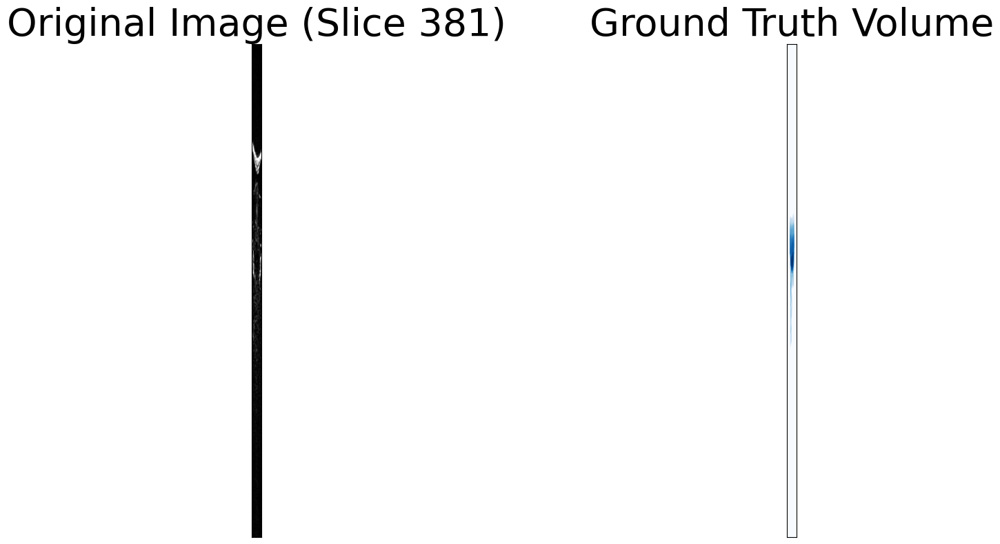

Visualizing case: MR_Spider_142_t2_spi mean DSC: 0.7655943378976735
Unique values in the ground truth: [0 1]


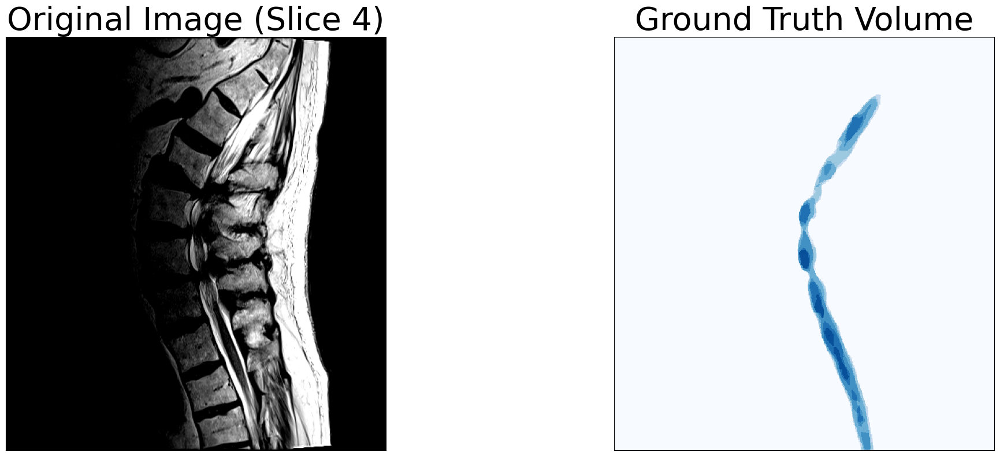

Visualizing case: CT_GTVpEnhance_segrap_0039 mean DSC: 0.7657027084186592
Unique values in the ground truth: [0 1]


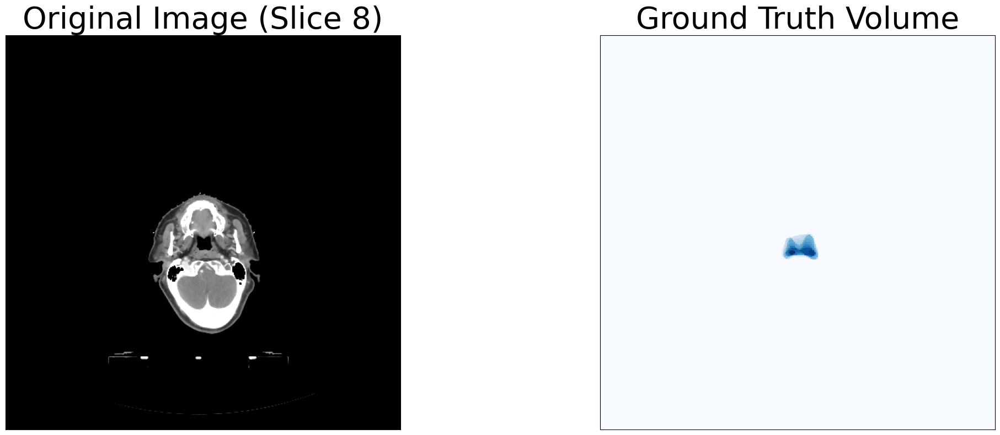

Visualizing case: MR_Spider_23_t2_spi mean DSC: 0.7795055083029696
Unique values in the ground truth: [0 1]


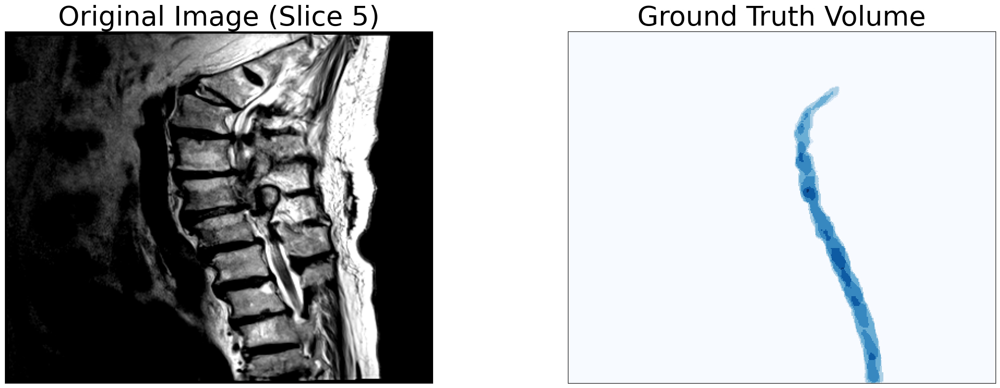

Visualizing case: MR_WMH_FLAIR_Amsterdam_Philips_VU_PETMR_01_169 mean DSC: 0.7858257253420436
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54]


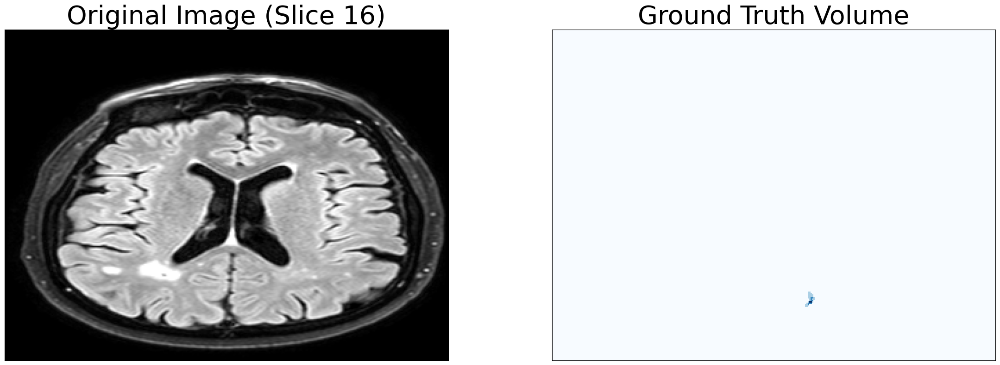

Visualizing case: CT_LungLesions_LUNG1-050 mean DSC: 0.7861807957471271
Unique values in the ground truth: [0 1 2]


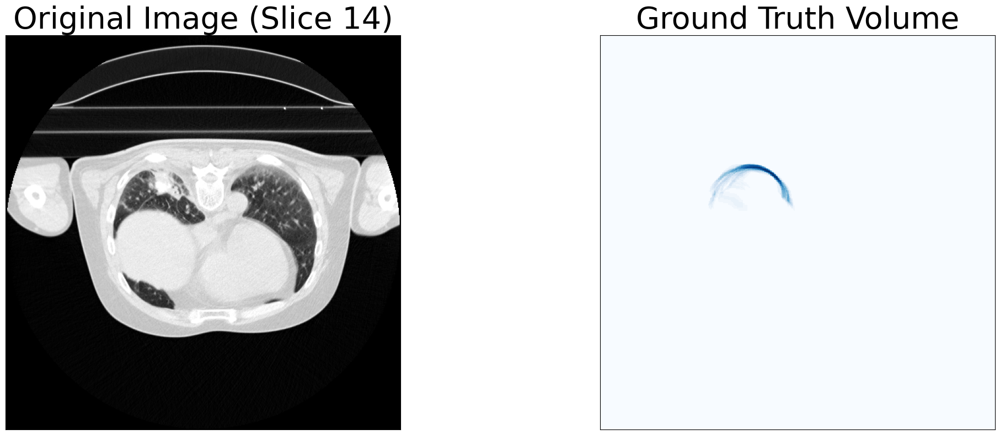

Visualizing case: MR_Spider_36_t2_spi mean DSC: 0.795028268034301
Unique values in the ground truth: [0 1]


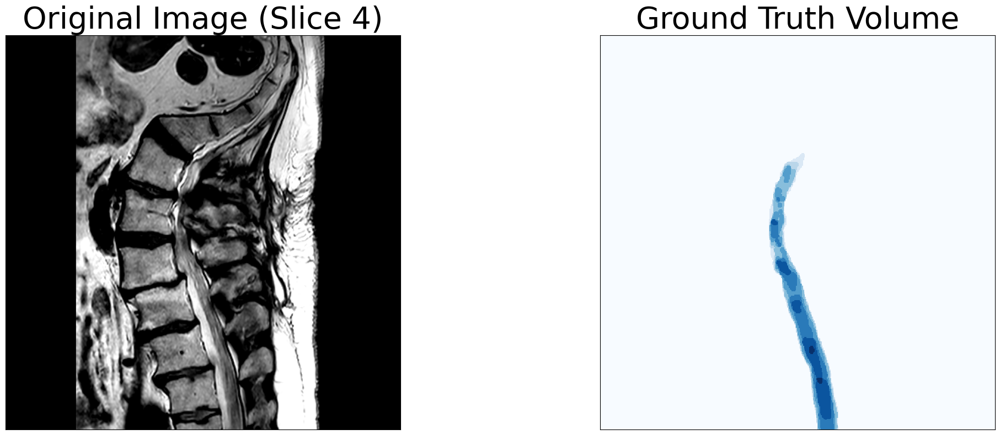

Visualizing case: MR_Spider_67_t2_vet mean DSC: 0.8016747613549887
Unique values in the ground truth: [0 1 2 3 4 5 6]


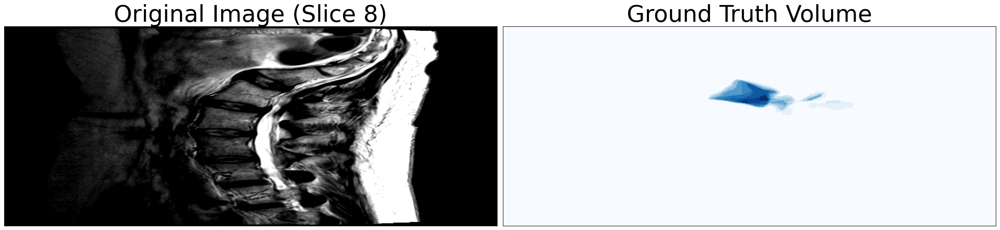

Visualizing case: MR_Spider_45_t1_spi mean DSC: 0.809216921028078
Unique values in the ground truth: [0 1]


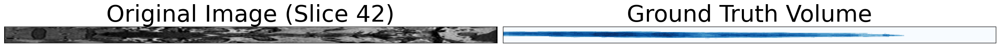

Visualizing case: CT_LNQ_LymphNode-0158 mean DSC: 0.81210706129432
Unique values in the ground truth: [0 1 2]


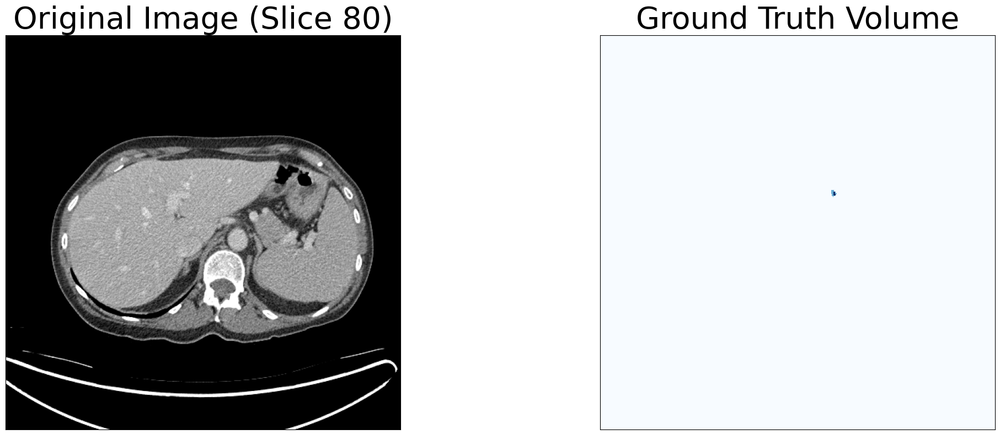

Visualizing case: MR_Spider_52_t1_spi mean DSC: 0.8195023157771867
Unique values in the ground truth: [0 1]


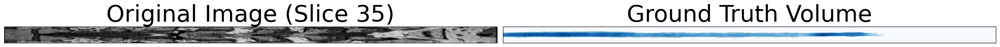

Visualizing case: PET_autoPET_psma_a3c5675abaec3e1d_2017-08-14 mean DSC: 0.8196928999241252
Unique values in the ground truth: [0 1]


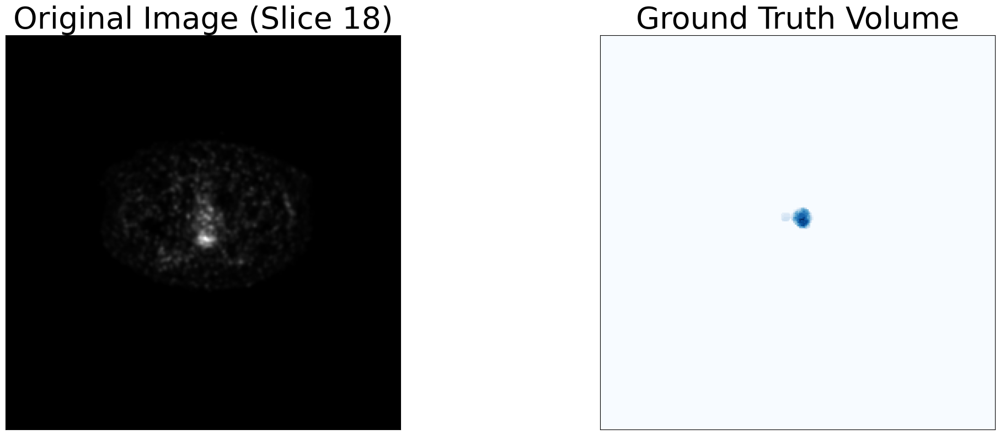

Visualizing case: CT_AbdTumor_colon_108 mean DSC: 0.8292253376218457
Unique values in the ground truth: [0 1]


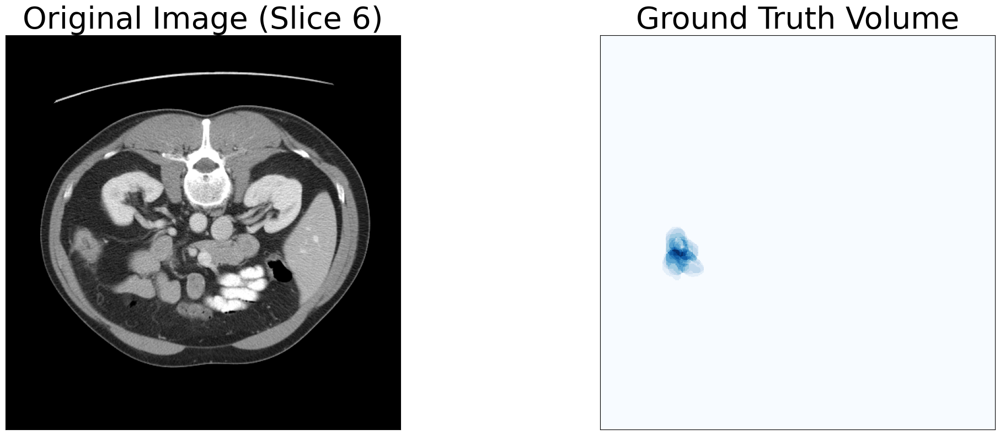

Visualizing case: MR_heart-ACDC_ACDC_patient091_frame01_myo mean DSC: 0.8315812541361165
Unique values in the ground truth: [0 1]


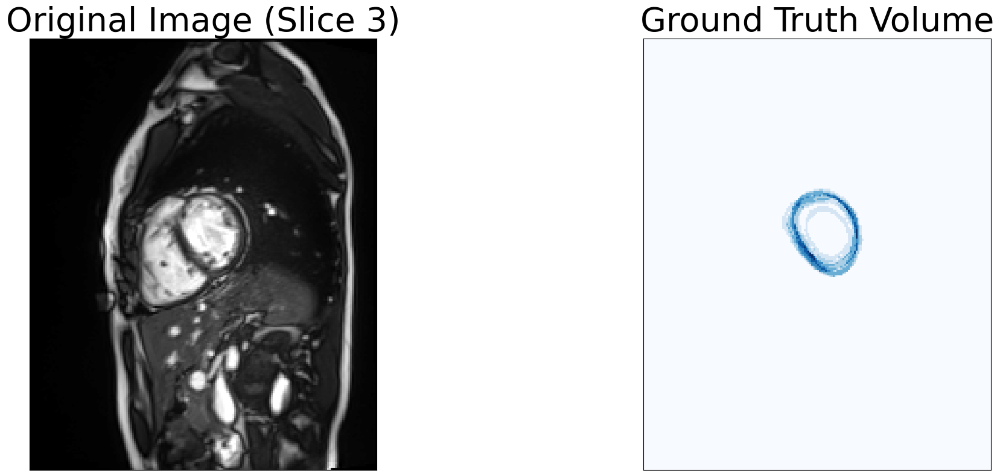

Visualizing case: US_Low-limb-Leg44 mean DSC: 0.8355670971485296
Unique values in the ground truth: [0 1 2 3]


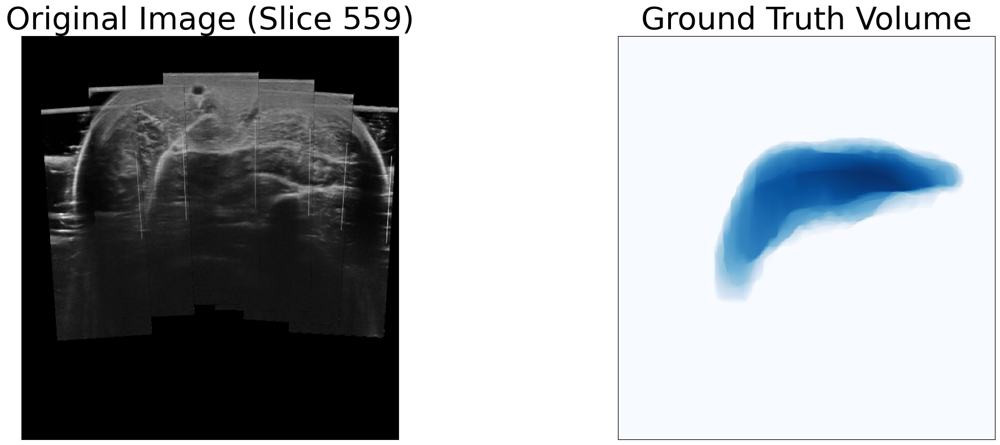

Visualizing case: CT_AirwayTree_ATM_039 mean DSC: 0.83738257218008
Unique values in the ground truth: [0 1]


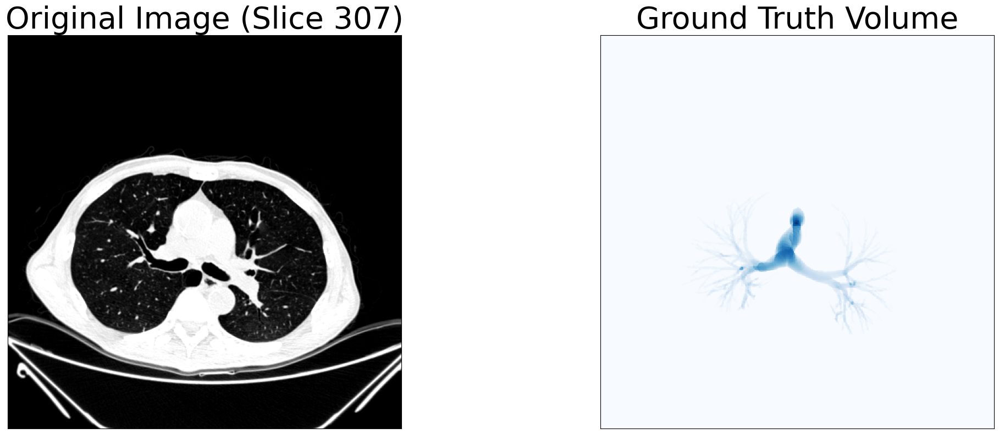

Visualizing case: US_Cardiac_patient0220_2CH_half_sequence mean DSC: 0.856147274802953
Unique values in the ground truth: [0 1 2 3]


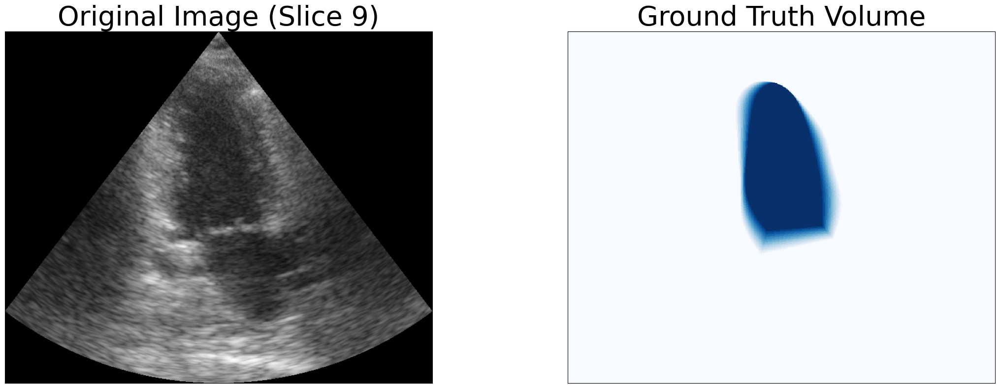

Visualizing case: Microscopy_SELMA3D_patchvolume_ADplaques_001 mean DSC: 0.8568258972812787
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85]


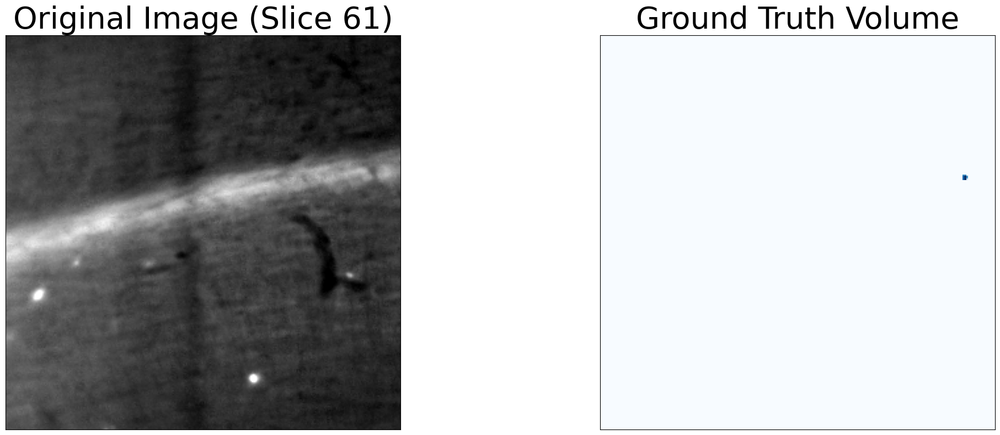

Visualizing case: MR_AMOSMR_amos_0553 mean DSC: 0.8571842156494299
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


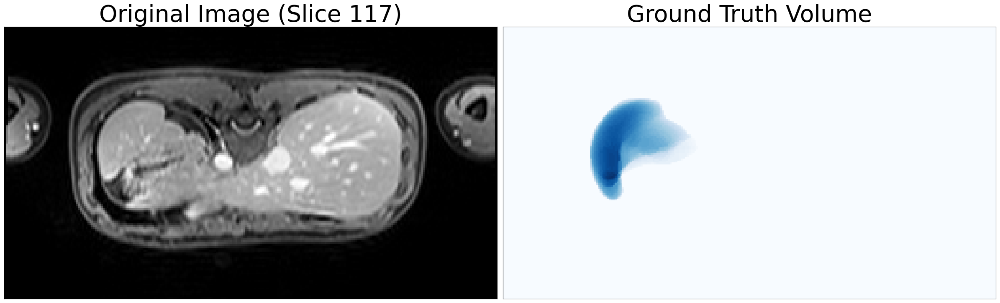

Visualizing case: CT_COVID19-CT-Seg-Bench_coronacases_006 mean DSC: 0.8614529729310128
Unique values in the ground truth: [0 1]


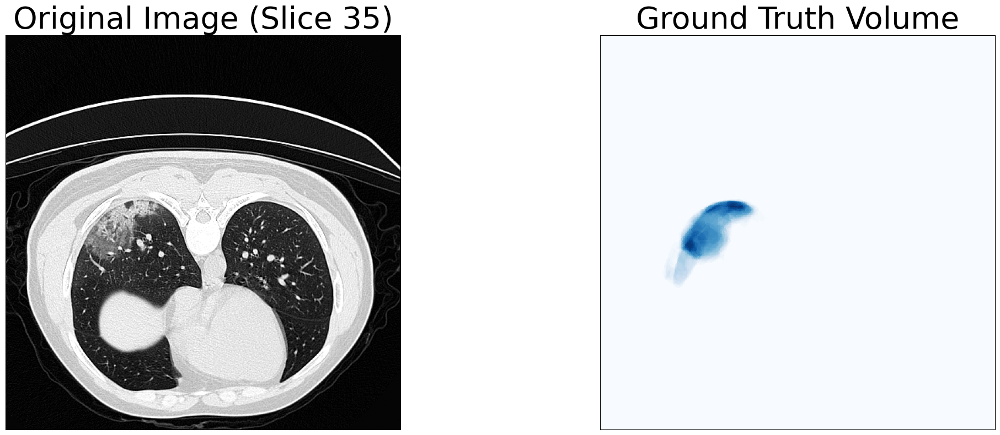

Visualizing case: MR_Head_HNTSMRG24_175_midRT_T2 mean DSC: 0.8690525474642826
Unique values in the ground truth: [0 1 2]


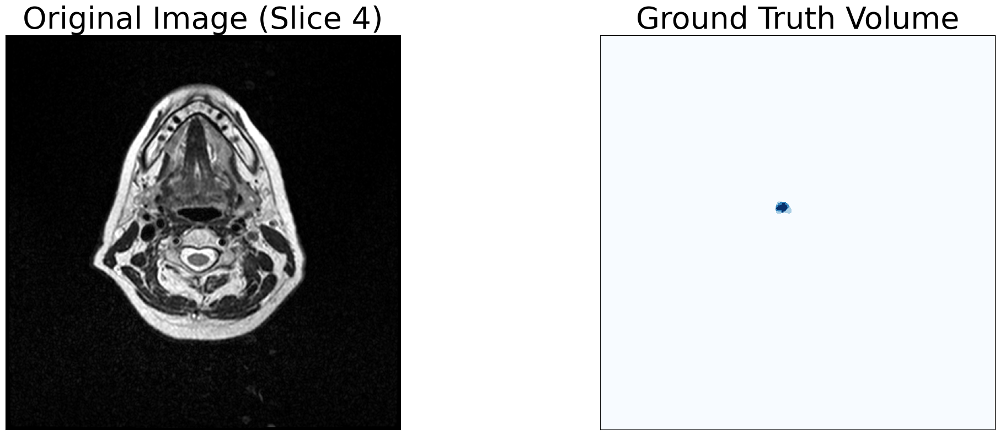

Visualizing case: CT_AMOS_amos_0079 mean DSC: 0.8829229822328206
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


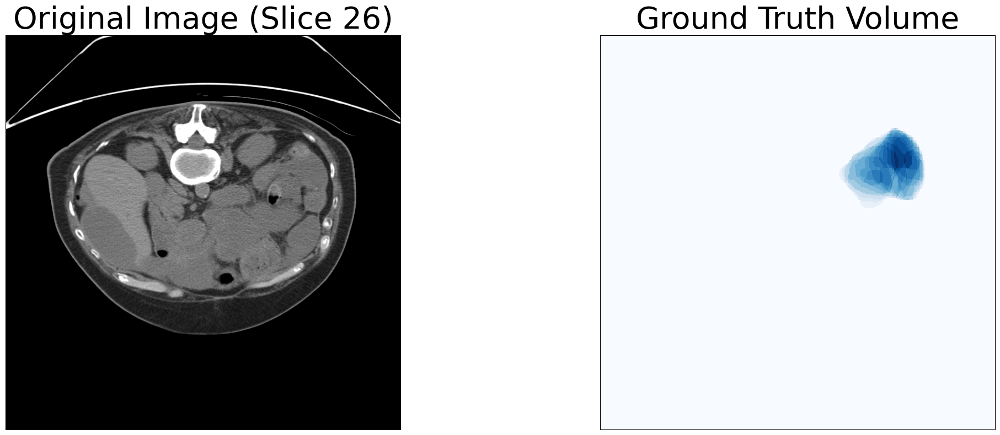

Visualizing case: CT_TotalSeg_cardiac_s1342 mean DSC: 0.8993002122420581
Unique values in the ground truth: [0 1 2 3 4 5]


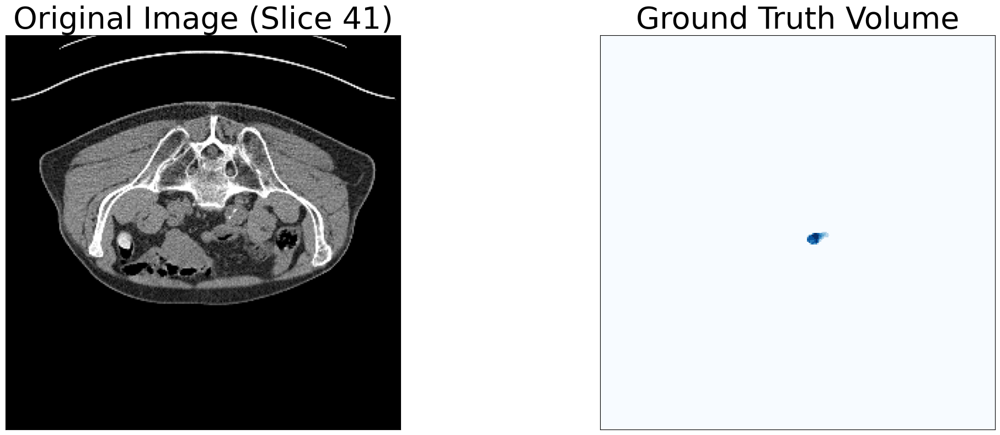

Visualizing case: CT_TCIA-LCTSC_LCTSC-Test-S3-204 mean DSC: 0.9151562860321004
Unique values in the ground truth: [0 1 2 3 4 5]


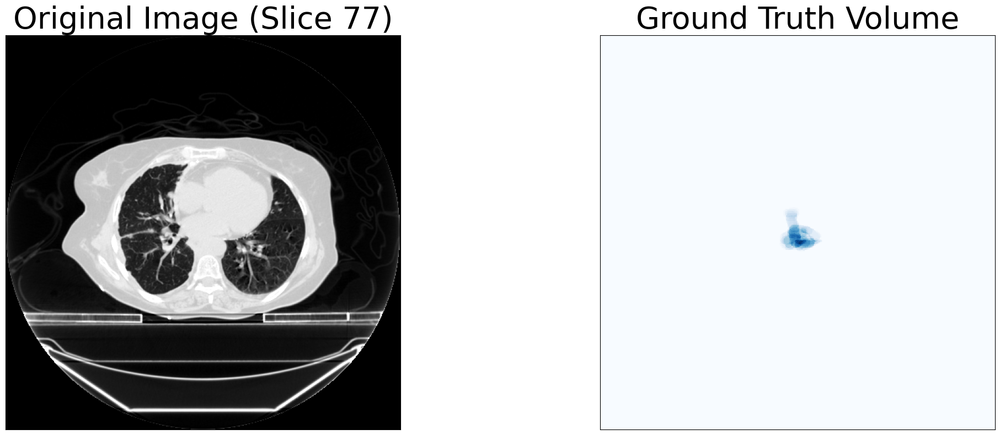

Visualizing case: CT_AbdomenAtlas_BDMAP_00001855 mean DSC: 0.9161631216238798
Unique values in the ground truth: [0 1 2 3 4 5 6 7 8 9]


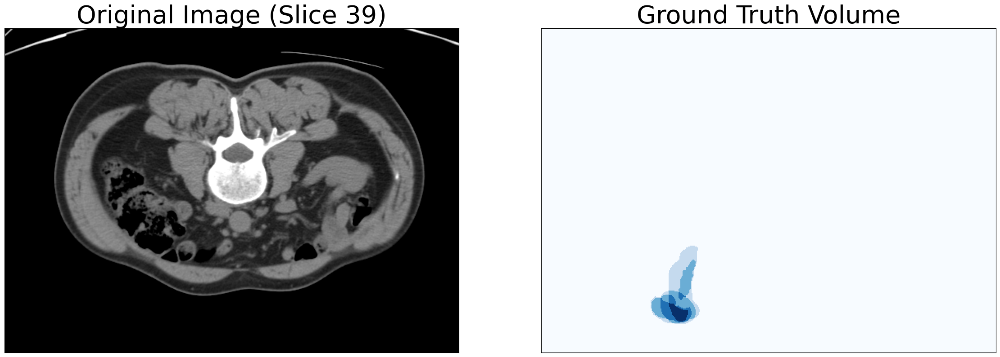

Visualizing case: MR_ProstateADC_ADC-ProstateX-0228 mean DSC: 0.9167130802772402
Unique values in the ground truth: [0 1]


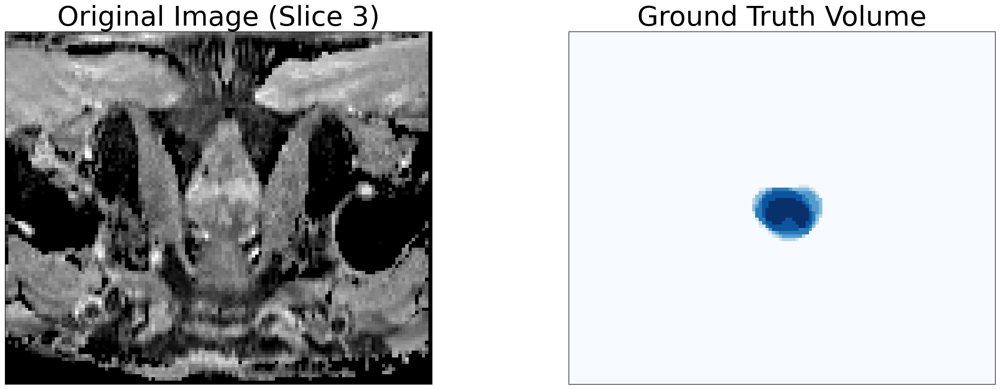

Visualizing case: MR_CHAOS-T1_20_T1DUAL mean DSC: 0.9268282854747893
Unique values in the ground truth: [0 1 2 3 4]


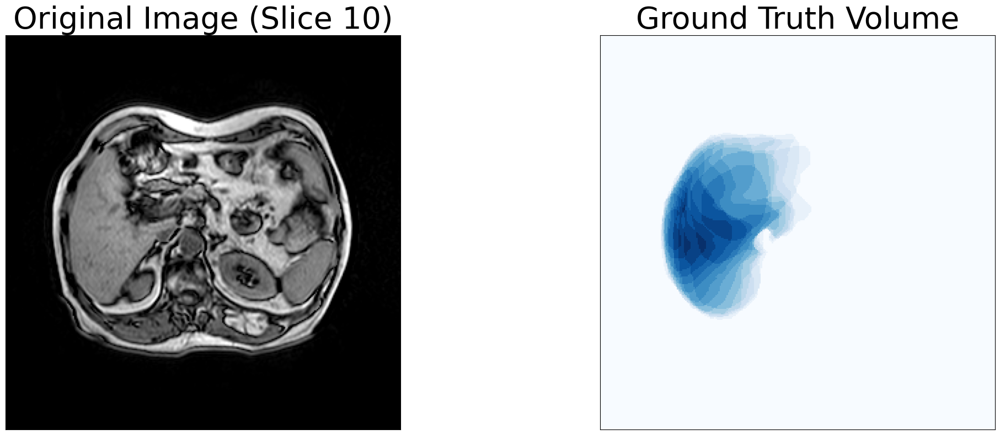

Visualizing case: MR_Heart_la_009 mean DSC: 0.9306394490125613
Unique values in the ground truth: [0 1]


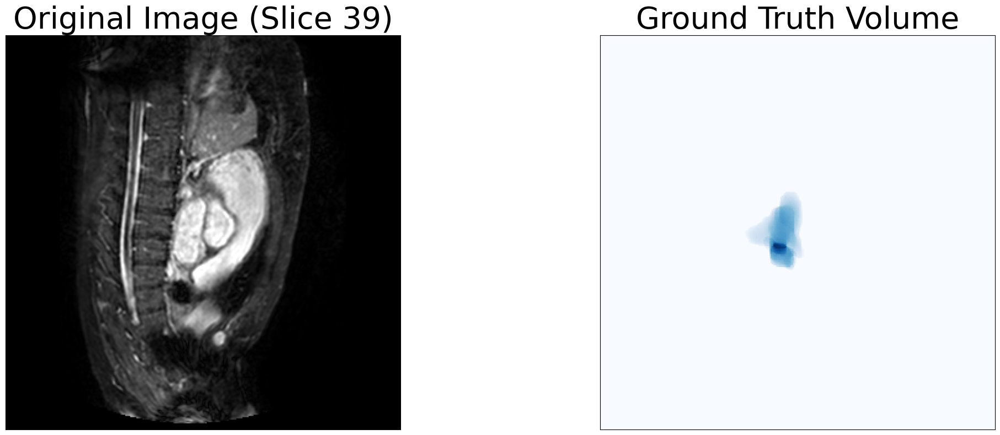

Visualizing case: MR_CHAOS-T2_8_T2SPIR mean DSC: 0.9429877454714579
Unique values in the ground truth: [0 1 2 3 4]


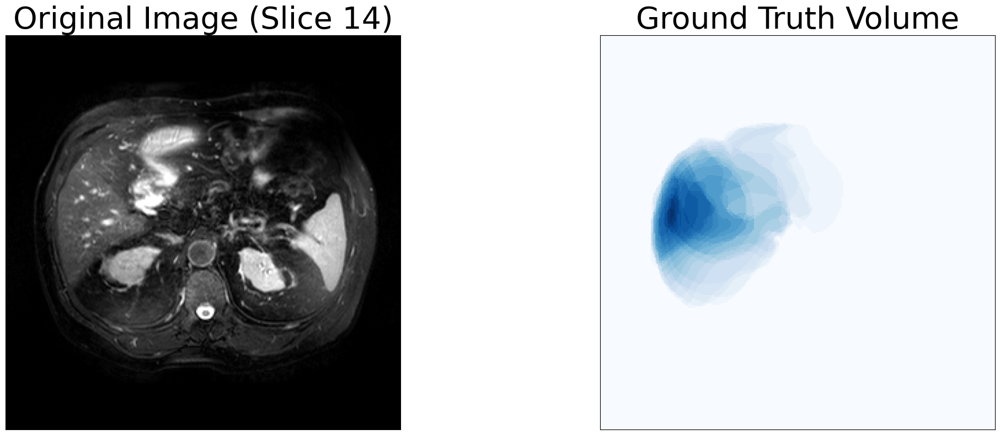

Visualizing case: CT_totalseg-vertebrae_s1304 mean DSC: 0.9550197046161822
Unique values in the ground truth: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]


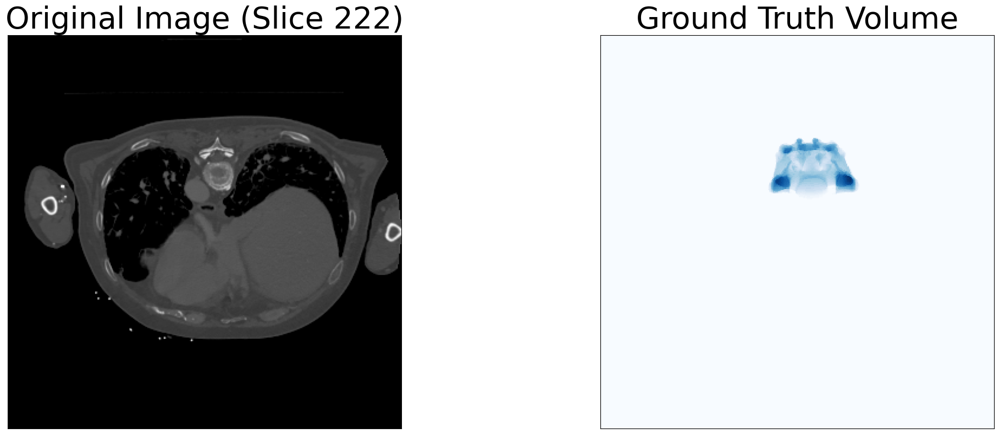

Visualizing case: CT_LungMasks_LUNG1-128 mean DSC: 0.9688527247647842
Unique values in the ground truth: [0 1 2]


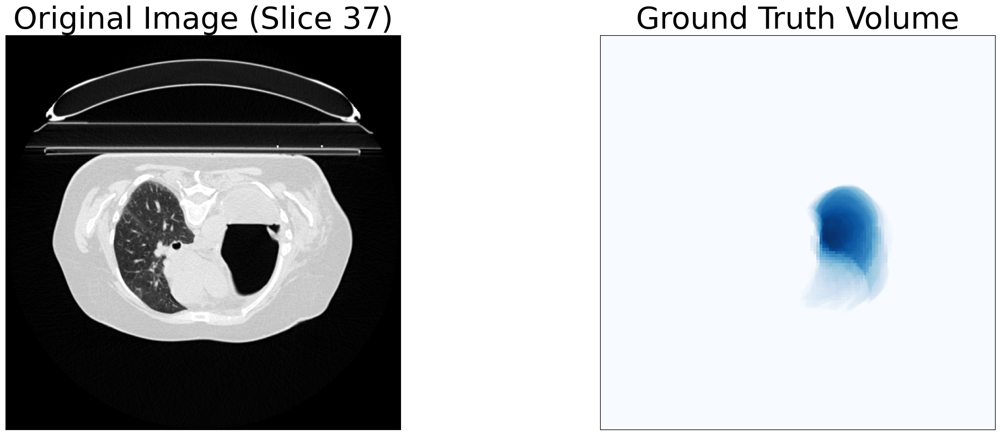

In [54]:
for name, min_dsc, mean_dsc in case_names:
    print(f"Visualizing case: {name} mean DSC: {mean_dsc}")
    visualize_case_3D(name)

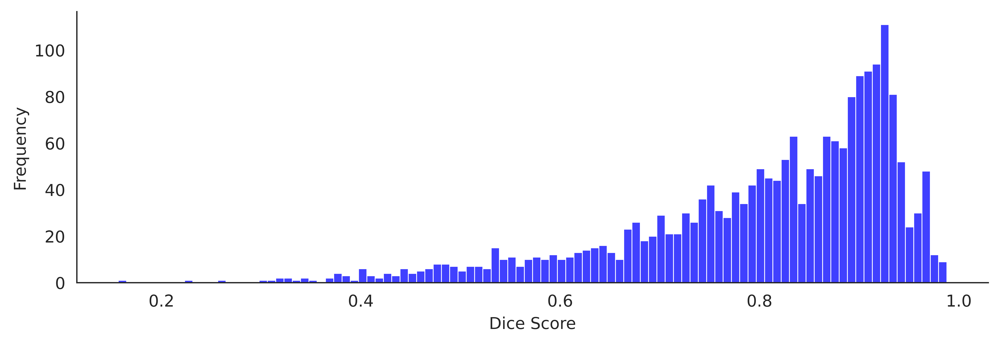

In [68]:
import seaborn as sns
sns.set_style("white")
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(10,3), dpi= 1000)
ax = sns.histplot(merged_df["nninteractive_DSC_Final"], bins=100, color="blue", )#**kwargs)
# ax.set_title("Dice distribution across the SegFM3D dataset (2130 various contrasts)", fontsize=16)
ax.set(xlabel="Dice Score", ylabel="Frequency")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
#ax.spines['left'].set_visible(False)

In [64]:
len(merged_df)

2130